In [1]:
import dask.dataframe as dd
import pandas as pd
import folium

import datetime
import time

import numpy as np
import seaborn as sns
import matplotlib.pylab as plt
import matplotlib


from matplotlib import rcParams
import gpxpy.geo
from sklearn.cluster import MiniBatchKMeans, KMeans#Clustering
import math
import pickle
import os
mingw_path = 'C:\\Program Files\\mingw-w64\\x86_64-5.3.0-posix-seh-rt_v4-rev0\\mingw64\\bin'
os.environ['PATH'] = mingw_path + ';' + os.environ['PATH']

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

In [2]:
pip install xgboost

In [3]:
pip install gpxpy

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [5]:
month = dd.read_csv("yellow_tripdata_2015-01.csv")
print(month.columns)

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')


In [6]:
month.head(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,15-01-2015 19:05,15-01-2015 19:23,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,10-01-2015 20:33,10-01-2015 20:53,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759110,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,10-01-2015 20:33,10-01-2015 20:43,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,10-01-2015 20:33,10-01-2015 20:35,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,10-01-2015 20:33,10-01-2015 20:52,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30


In [7]:
n_rows = len(month)
n_rows

1048575

In [8]:
outlier_locations = month[((month.pickup_longitude != 0) & (month.pickup_latitude != 0)) &
                          ((month.pickup_longitude <= -74.15) | (month.pickup_latitude <= 40.5774) |
                           (month.pickup_longitude >= -73.7004) | (month.pickup_latitude >= 40.9176))]

# Creating a map using 'OpenStreetMap'
map_osm = folium.Map(location=[40.734695, -73.990372], tiles='OpenStreetMap')
sample_locations = outlier_locations.head(100)
for i, j in sample_locations.iterrows():
    folium.Marker(list((j['pickup_latitude'], j['pickup_longitude']))).add_to(map_osm)
map_osm


In [9]:
# Removing the outlier trips based on trip durations

In [10]:
def convert_to_unix(s):
    return time.mktime(datetime.datetime.strptime(s, "%d-%m-%Y %H:%M").timetuple())

#return a dataframe with many parameters along with trip duration and trip pickup times(with outliers)
def return_with_trip_times():
    duration = month[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    #pickups and dropoffs to unix time
    duration_pickup = [convert_to_unix(x) for x in duration['tpep_pickup_datetime'].values]
    duration_drop = [convert_to_unix(x) for x in duration['tpep_dropoff_datetime'].values]
    #calculate duration of trips
    durations = (np.array(duration_drop) - np.array(duration_pickup))/float(60)

    #append durations of trips and pickup times in unix to a new dataframe
    new_frame = month[['VendorID','payment_type','passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','RateCodeID','store_and_fwd_flag']].compute()

    new_frame['trip_times'] = durations
    new_frame['pickup_times'] = duration_pickup
    new_frame['Speed'] = 60*(new_frame['trip_distance']/new_frame['trip_times'])

    return new_frame
#duration_dropoff

#outliers aren't still removed
#dataframe with durations and pickup unix time appended
frame_with_durations = return_with_trip_times()

In [11]:
frame_with_durations = return_with_trip_times()

Original: 1048575
Removing outliers from NY boundaries: 1024364 24211

trip times percentiles...


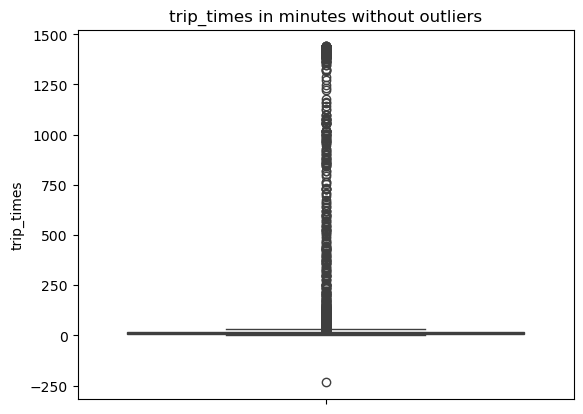

0.0th percentile -234.0
10.0th percentile 4.0
20.0th percentile 5.0
30.0th percentile 7.0
40.0th percentile 8.0
50.0th percentile 10.0
60.0th percentile 12.0
70.0th percentile 14.0
80.0th percentile 18.0
90.0th percentile 23.0
100.0th percentile 1440.0
(1024364, 13) before frist
(1020769, 13) frist    VendorID  payment_type  passenger_count  trip_distance  pickup_longitude  \
0         2             1                1           1.59        -73.993896   
1         1             1                1           3.30        -74.001648   
2         1             2                1           1.80        -73.963341   
3         1             2                1           0.50        -74.009087   
4         1             2                1           3.00        -73.971176   

   pickup_latitude  dropoff_longitude  dropoff_latitude  RateCodeID  \
0        40.750111         -73.974785         40.750618           1   
1        40.724243         -73.994415         40.759110           1   
2        40.

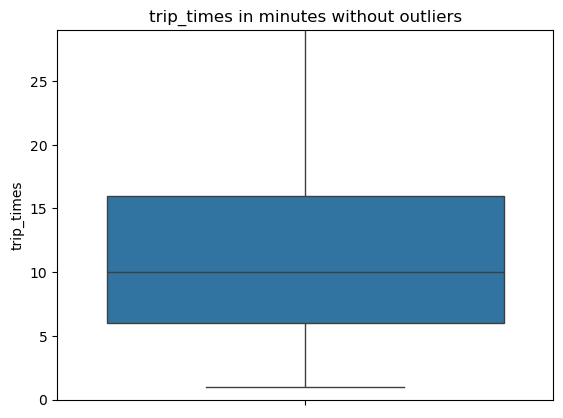

(1020769, 13) second

trip distance percentiles...


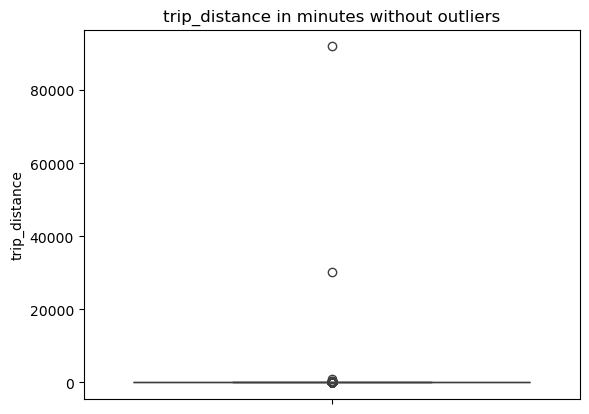

0.0th percentile 0.0
10.0th percentile 0.66
20.0th percentile 0.9
30.0th percentile 1.1
40.0th percentile 1.37
50.0th percentile 1.68
60.0th percentile 2.05
70.0th percentile 2.6
80.0th percentile 3.53
90.0th percentile 5.87
100.0th percentile 169.8
Removing outliers from trip distance: 1018004 2765


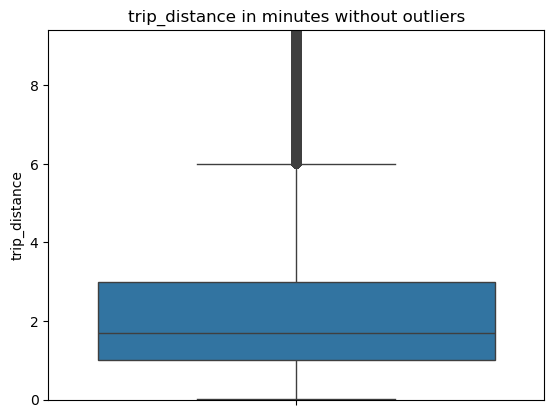


Speed percentiles...


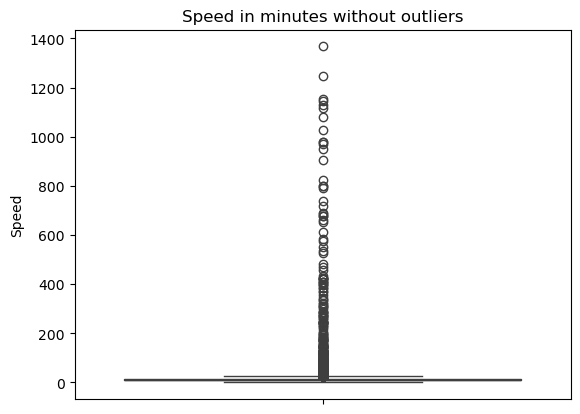

0.0th percentile 0.022
10.0th percentile 6.372
20.0th percentile 7.8
30.0th percentile 9.0
40.0th percentile 10.0
50.0th percentile 11.027
60.0th percentile 12.157
70.0th percentile 13.8
80.0th percentile 16.0
90.0th percentile 20.25
100.0th percentile 1146.0
Removing outliers from trip speed: 1017808 196


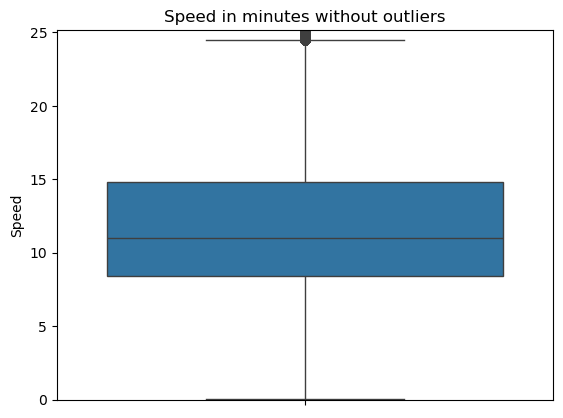

Total outliers removed 30767


In [12]:
def plot_boxplot(new_frame, string1, string2):
    var = new_frame[string1].values
    var = np.sort(var,axis = None)
    if string2!="":
        plt.ylim(0, var[int(float(95)*len(var)/100)])
    sns.boxplot(y= string1, data = new_frame)
    plt.title(string1+' in minutes without outliers')
    plt.show()
    return var
    exp
def remove_outliers(new_frame):
    print ("Original:",new_frame.shape[0])
    a = new_frame.shape[0]
    new_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    print ("Removing outliers from NY boundaries:",new_frame.shape[0],(a - new_frame.shape[0]))
    b = new_frame.shape[0]

    print ("\ntrip times percentiles...")
    var = plot_boxplot(new_frame, "trip_times", "")
    for i in range(0,len(var),int(float(10)*len(var)/100)):
        print ("{}th percentile {}".format(round(float(i)/len(var),3)*100,round(var[i],3)))

    print(new_frame.shape, "before frist")
    new_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    print(new_frame.shape, "frist", new_frame.head())
    print ("Removing outliers from trip times:",new_frame.shape[0],(b - new_frame.shape[0]))
    var = plot_boxplot(new_frame, "trip_times", "out")
    print(new_frame.shape, "second")
#--------------------------------------------------------------
    print ("\ntrip distance percentiles...")
    var = plot_boxplot(new_frame, "trip_distance", "")
    for i in range(0,len(var),int(float(10)*len(var)/100)):
        print ("{}th percentile {}".format(round(float(i)/len(var),3)*100,round(var[i],3)))

    c = new_frame.shape[0]
    new_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    print ("Removing outliers from trip distance:",new_frame.shape[0],(c - new_frame.shape[0]))
    var = plot_boxplot(new_frame,"trip_distance", "out")

#--------------------------------------------------------------

    print ("\nSpeed percentiles...")
    var = plot_boxplot(new_frame, "Speed", "")
    for i in range(0,len(var),int(float(10)*len(var)/100)):
        print ("{}th percentile {}".format(round(float(i)/len(var),3)*100,round(var[i],3)))

    d = new_frame.shape[0]
    new_frame = new_frame[(new_frame.Speed <= 65) & (new_frame.Speed >= 0)]
    print ("Removing outliers from trip speed:",new_frame.shape[0],(d - new_frame.shape[0]))
    var = plot_boxplot(new_frame, "Speed", "out")

#--------------------------------------------------------------
    print( "Total outliers removed",a - new_frame.shape[0])
    return new_frame

frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)

In [13]:
frame_with_durations_outliers_removed.head()

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,trip_times,pickup_times,Speed
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,18.0,1.421329e+09,5.300000
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759110,1,N,20.0,1.420902e+09,9.900000
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,10.0,1.420902e+09,10.800000
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,2.0,1.420902e+09,15.000000
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,19.0,1.420902e+09,9.473684


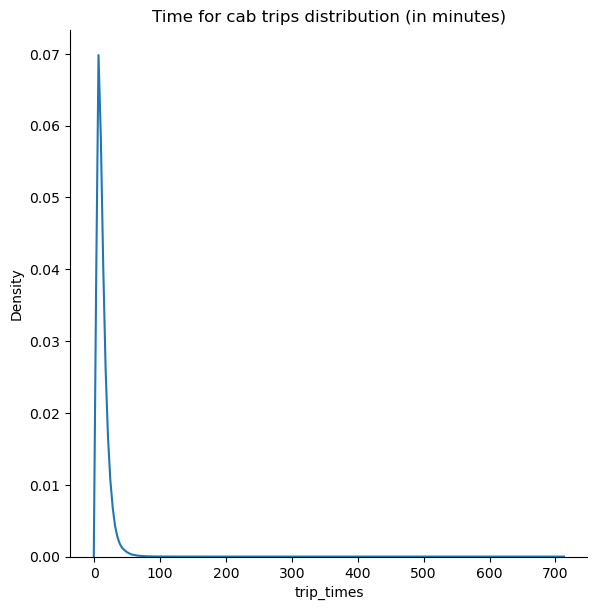

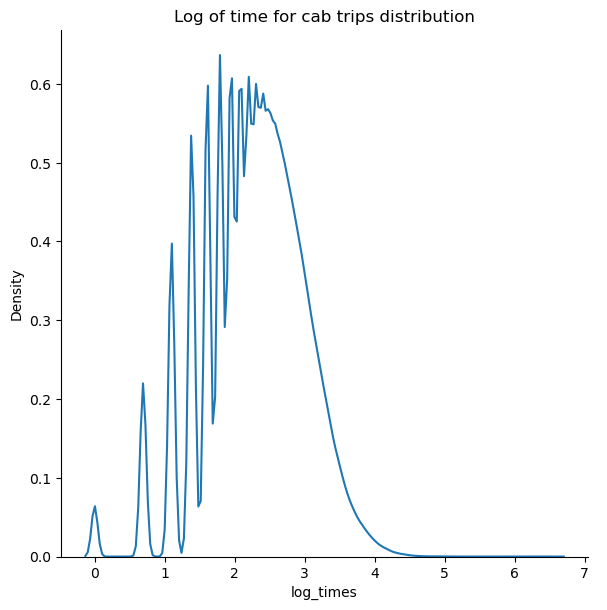

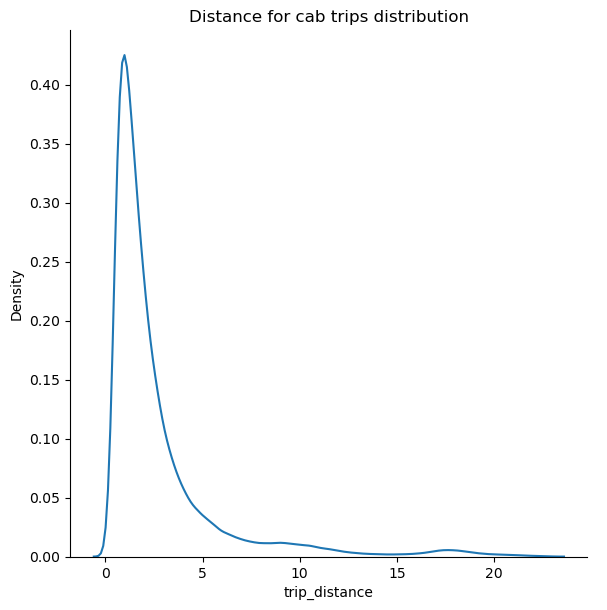

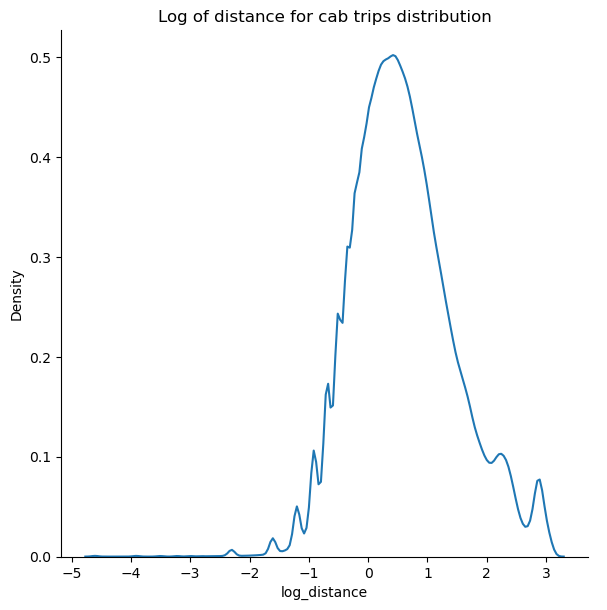

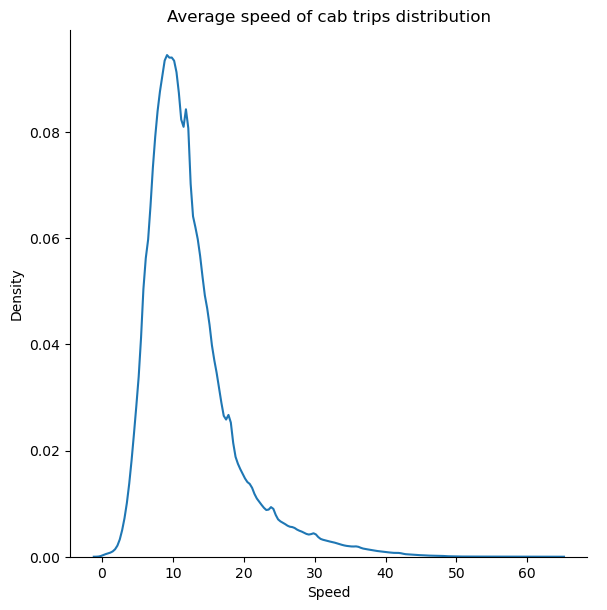

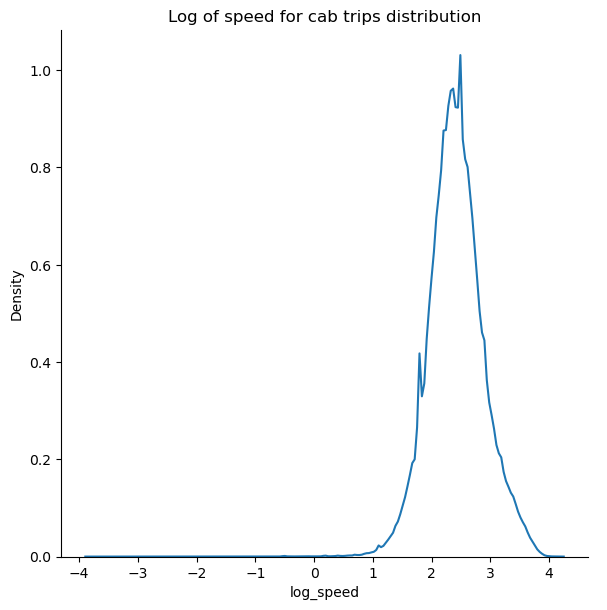

In [14]:
import seaborn as sns

#plot distribution of parameters
def dist_of_params(frame, variable, title):
    frame_reset_index = frame.reset_index(drop=True)  # Reset index to avoid duplicate labels
    sns.FacetGrid(frame_reset_index, height=6).map(sns.kdeplot, variable).add_legend()
    plt.title(title)
    plt.show()


# Plot distribution of trip times
dist_of_params(frame_with_durations_outliers_removed, 'trip_times', 'Time for cab trips distribution (in minutes)')

# Log trip times
log_trip_times = frame_with_durations_outliers_removed.trip_times.values
frame_with_durations_outliers_removed['log_times'] = np.log(log_trip_times)
dist_of_params(frame_with_durations_outliers_removed, 'log_times', 'Log of time for cab trips distribution')

# Plot distribution of trip distances
dist_of_params(frame_with_durations_outliers_removed, 'trip_distance', 'Distance for cab trips distribution')

# Log trip distances
log_trip_distance = frame_with_durations_outliers_removed.trip_distance.values
frame_with_durations_outliers_removed['log_distance'] = np.log(log_trip_distance)
dist_of_params(frame_with_durations_outliers_removed, 'log_distance', 'Log of distance for cab trips distribution')

# Plot distribution of trip speed
dist_of_params(frame_with_durations_outliers_removed, 'Speed', 'Average speed of cab trips distribution')

# Log trip speed
log_trip_speed = frame_with_durations_outliers_removed.Speed.values
frame_with_durations_outliers_removed['log_speed'] = np.log(log_trip_speed)
dist_of_params(frame_with_durations_outliers_removed, 'log_speed', 'Log of speed for cab trips distribution')


In [15]:
# # Univariate Analysis of following features
# Vendor ID
# Passenger counts
# Rate Code ID
# store and forward flags
# Payment types

In [16]:
# Inspecting number of pickups shared among each of the vendors

In [17]:

#Get unique vendors
vendor_unique = frame_with_durations_outliers_removed.VendorID.unique()
Vendors = []
#Get the number of trips for each vendor
Vendors.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['VendorID'] == 1].shape[0])
Vendors.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['VendorID'] == 2].shape[0])
#Names of vendors
print("Unique vendors\n {}: Creative Mobile Technologies\n {}: VeriFone Inc\n".format(vendor_unique[1],vendor_unique[0]))
print ("Vendor 1 and Vendor 2 count:\n",Vendors)

Unique vendors
 1: Creative Mobile Technologies
 2: VeriFone Inc

Vendor 1 and Vendor 2 count:
 [480091, 537717]


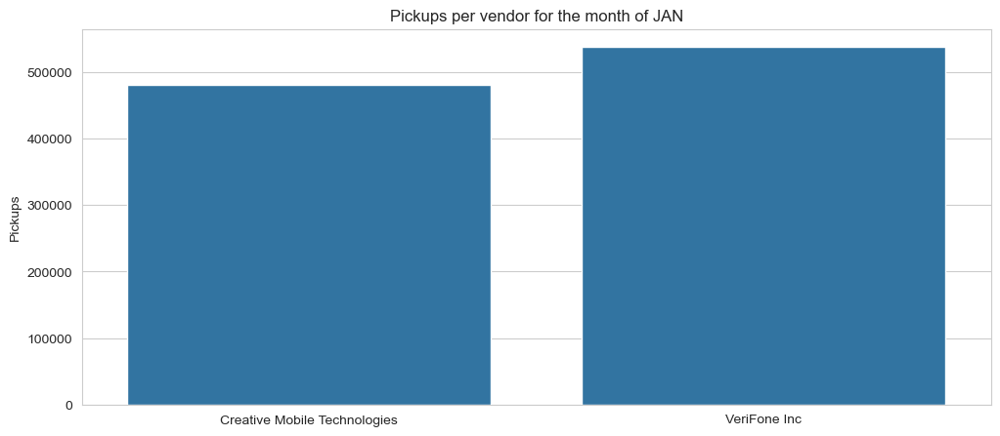

In [18]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x=['Creative Mobile Technologies', 'VeriFone Inc'], y=np.array(Vendors))
ax.set(ylabel='Pickups')
plt.title('Pickups per vendor for the month of JAN')  # Use plt.title() instead of sns.plt.title()
plt.show()


In [19]:
print ("Creative Mobile Technologies share :{} % VeriFone Inc share :{} % ".format(100*float(Vendors[1])/sum(Vendors),100*float(Vendors[0])/sum(Vendors)))

Creative Mobile Technologies share :52.830887554430696 % VeriFone Inc share :47.169112445569304 % 


In [20]:
# Both the vendors share almost same number of pickups in JAN month

In [21]:
#Get the number of pickups per each passenger count
passenger_count = []
passenger_uniq = set(frame_with_durations_outliers_removed['passenger_count'].values)
for i in passenger_uniq:
    passenger_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['passenger_count'] == i].shape[0])

#sort the passenger pickups based on the passenger count
pass_count_pickups = [x for _,x in sorted(zip(passenger_uniq,passenger_count))]
pass_count = [int(y) for y,_ in sorted(zip(passenger_uniq,passenger_count))]

print (pass_count)
print (pass_count_pickups)

[0, 1, 2, 3, 4, 5, 6]
[504, 716473, 144823, 42336, 20242, 56407, 37023]


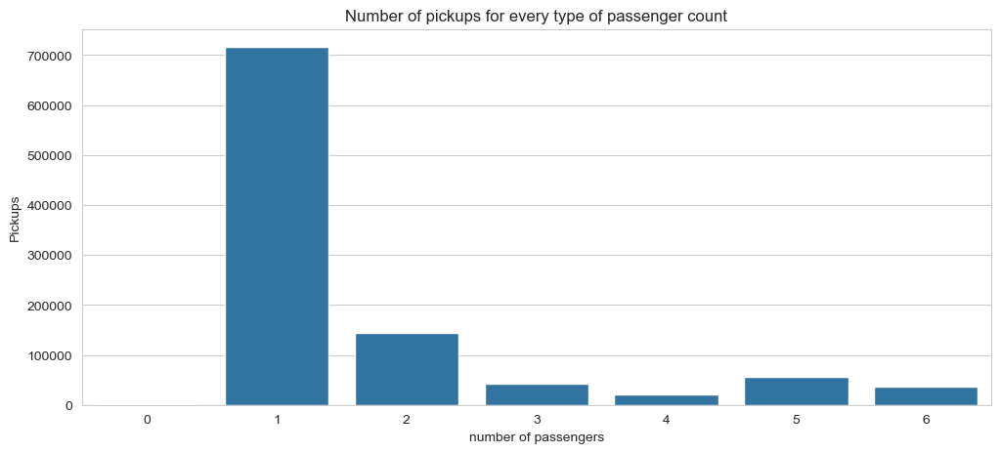

In [22]:

sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = np.array(pass_count) , y = np.array(pass_count_pickups))
ax.set(ylabel='Pickups',xlabel = 'number of passengers')
plt.title('Number of pickups for every type of passenger count')
plt.show()

In [23]:
for a,b in zip(pass_count,pass_count_pickups):
    print ("Pickups for passenger count {} : {}% of total pickups".format(int(a),round(float(b)*100/sum(pass_count_pickups),4)))

Pickups for passenger count 0 : 0.0495% of total pickups
Pickups for passenger count 1 : 70.3937% of total pickups
Pickups for passenger count 2 : 14.2289% of total pickups
Pickups for passenger count 3 : 4.1595% of total pickups
Pickups for passenger count 4 : 1.9888% of total pickups
Pickups for passenger count 5 : 5.542% of total pickups
Pickups for passenger count 6 : 3.6375% of total pickups


In [24]:
# Rate Code:
# Standard rate
# JFK  ###trips originating or terminating at John F. Kennedy International Airport
# Newark ##Trips to or from Newark Liberty International Airport
# Nassau or Westchester  ##Taxi rides to Nassau County or Westchester County
# Negotiated fare
# Group ride  # multiple passengers sharing the same ride, often at a discounted rate.

In [25]:
#Unique rate codes
rate_codes_uniq = set(frame_with_durations_outliers_removed['RateCodeID'].values)
rate_count = []
for i in rate_codes_uniq:
    rate_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['RateCodeID'] == i].shape[0])
#sort the pickups based on the rate codes
rate_code_pickups = [x for _,x in sorted(zip(rate_codes_uniq,rate_count))]
rate_code = [int(y) for y,_ in sorted(zip(rate_codes_uniq,rate_count))]
Trips = ['Standard rates','JFK trips','Newark trips','Nassau/Westchester trips','Negotiated fare','Group rides','unknownrate code']

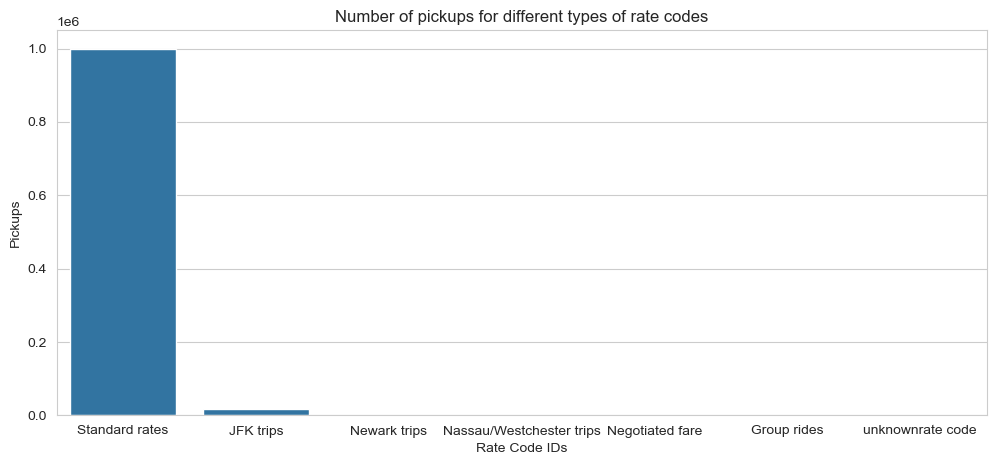

In [26]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = np.array(Trips) , y = np.array(rate_code_pickups))
ax.set(ylabel='Pickups',xlabel = 'Rate Code IDs')
plt.title('Number of pickups for different types of rate codes')
plt.show()

In [27]:
for a,b in zip(Trips,rate_code_pickups):
    print ("Pickups for/with {} accounts {}% of total pickups".format(a,round(float(b)*100/sum(rate_code_pickups),4)))

Pickups for/with Standard rates accounts 98.2211% of total pickups
Pickups for/with JFK trips accounts 1.668% of total pickups
Pickups for/with Newark trips accounts 0.0069% of total pickups
Pickups for/with Nassau/Westchester trips accounts 0.0131% of total pickups
Pickups for/with Negotiated fare accounts 0.0883% of total pickups
Pickups for/with Group rides accounts 0.0001% of total pickups
Pickups for/with unknownrate code accounts 0.0026% of total pickups


In [28]:
# Rate Codes(Findings from the data):


In [29]:
SWflag_uniq = set(frame_with_durations_outliers_removed['store_and_fwd_flag'].values)
SWflag_count = []
for i in SWflag_uniq :
    SWflag_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['store_and_fwd_flag'] == i].shape[0])
print (SWflag_count)
SWflag_uniq = list(SWflag_uniq)
print (SWflag_uniq)

[8867, 1008941]
['Y', 'N']


In [30]:
for a,b in zip(SWflag_uniq,SWflag_count):
    print ("Pickups for/with store and forward = {} accounts {}% of total pickups".format(a,round(float(b)*100/sum(SWflag_count),4)))

Pickups for/with store and forward = Y accounts 0.8712% of total pickups
Pickups for/with store and forward = N accounts 99.1288% of total pickups


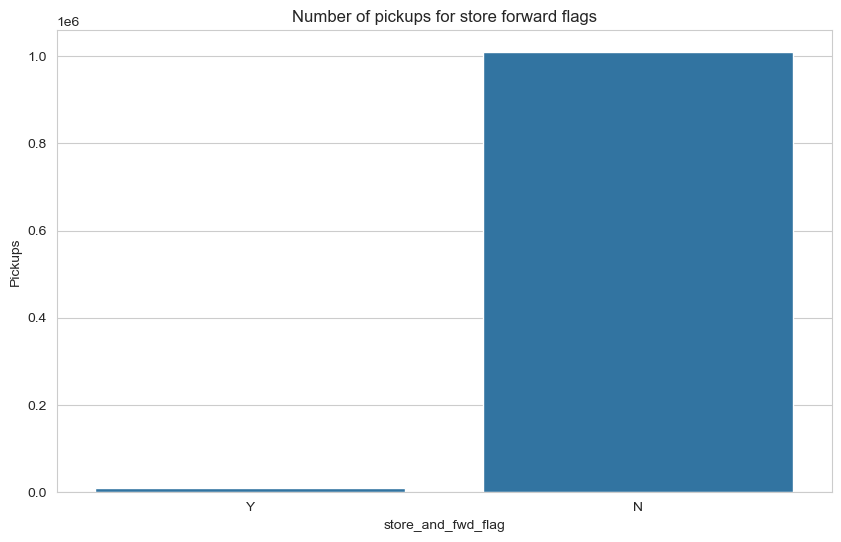

In [31]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(10, 6)

ax = sns.barplot(x=np.array(SWflag_uniq), y=np.array(SWflag_count))
ax.set(ylabel='Pickups', xlabel='store_and_fwd_flag')
plt.title('Number of pickups for store forward flags')  
plt.show()


In [32]:
# Payment types:
# Credit card
# Cash
# No charge
# Dispute
# Unknown
# Voided trip

In [33]:
payment_uniq = set(frame_with_durations_outliers_removed['payment_type'].values)
payment_count = []
for i in payment_uniq :
    payment_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['payment_type'] == i].shape[0])
print (payment_count)
payment_uniq = list(payment_uniq)
print (payment_uniq)

[631086, 383865, 2148, 709]
[1, 2, 3, 4]


In [34]:
pay_pickups = [x for _,x in sorted(zip(payment_uniq,payment_count))]
pay = [int(y) for y,_ in sorted(zip(payment_uniq,payment_count))]
pay_type = ['Credit card','Cash','No charge','Dispute','Unknow']

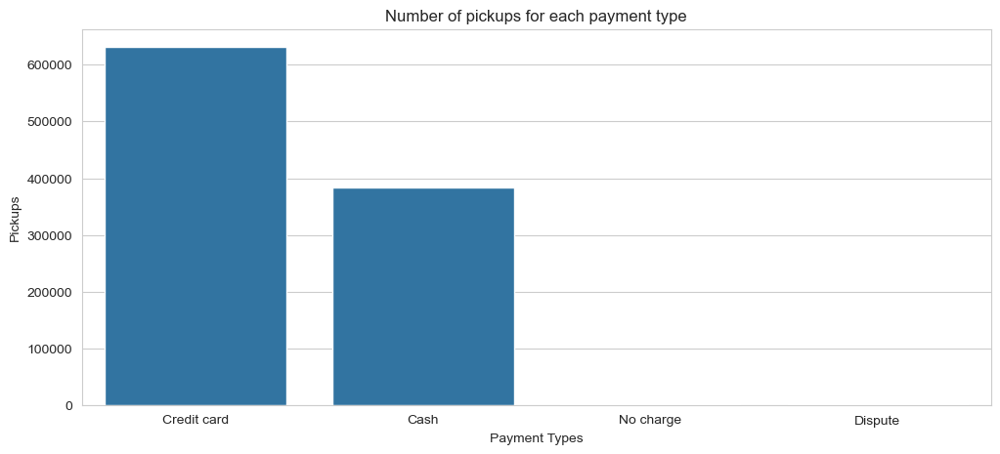

In [35]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x=np.array(pay_type)[:4], y=np.array(pay_pickups))
ax.set(ylabel='Pickups', xlabel='Payment Types')
plt.title('Number of pickups for each payment type')
plt.show()


In [36]:
for a,b in zip(pay_type,pay_pickups):
    print ("Pickups with payment types {} accounts to :{}% of total pickups".format(a,round(float(b)*100/sum(pay_pickups),4)))

Pickups with payment types Credit card accounts to :62.0044% of total pickups
Pickups with payment types Cash accounts to :37.7149% of total pickups
Pickups with payment types No charge accounts to :0.211% of total pickups
Pickups with payment types Dispute accounts to :0.0697% of total pickups


In [37]:
# Pickup and dropoff locations on maps:

In [38]:
frame_with_durations_outliers_removed['lat_bin'] = np.round(frame_with_durations_outliers_removed['pickup_latitude'],4)
frame_with_durations_outliers_removed['lon_bin'] = np.round(frame_with_durations_outliers_removed['pickup_longitude'],4)


In [39]:
import numpy as np
from sklearn.cluster import MiniBatchKMeans
pickup_coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values
cluster_algo = MiniBatchKMeans(n_clusters=40, batch_size=1000)
cluster_algo.fit(pickup_coords)
frame_with_durations_outliers_removed['pickup_cluster'] = cluster_algo.predict(
    frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']]
)
frame_with_durations_outliers_removed['dropoff_cluster'] = cluster_algo.predict(
    frame_with_durations_outliers_removed[['dropoff_latitude', 'dropoff_longitude']]
)

C:\Users\HP\anaconda3\anaconda new\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MiniBatchKMeans was fitted without feature names
  warnings.warn(
C:\Users\HP\anaconda3\anaconda new\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MiniBatchKMeans was fitted without feature names
  warnings.warn(


In [40]:
import numpy as np
from sklearn.cluster import MiniBatchKMeans

# Extracting the Coordinates using df
coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].to_numpy()

# Getting 40 clusters using k-means
kmeans = MiniBatchKMeans(n_clusters=40, batch_size=1000).fit(coords)


frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
frame_with_durations_outliers_removed['dropoff_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['dropoff_latitude', 'dropoff_longitude']])


C:\Users\HP\anaconda3\anaconda new\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MiniBatchKMeans was fitted without feature names
  warnings.warn(
C:\Users\HP\anaconda3\anaconda new\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MiniBatchKMeans was fitted without feature names
  warnings.warn(


In [42]:
def convert_clusters(df, cluster_col):
    regions = []
    color_map = []
    queens_clusters = {4, 16, 22, 23, 26, 35, 36}
    brooklyn_clusters = {11, 19, 29, 37}
    for cluster_id in df[cluster_col].values:
        if cluster_id == 2:
            regions.append("JFK")
            color_map.append('#7CFC00')  
        elif cluster_id == 13:
            regions.append("Bronx")
            color_map.append('#DC143C')
        elif cluster_id in queens_clusters:
            regions.append("Queens")
            color_map.append('#00FFFF')
        elif cluster_id in brooklyn_clusters:
            regions.append("Brooklyn")
            color_map.append('#FFD700')
        else:
            regions.append("Manhattan")
            color_map.append('#FFFFFF')

    df[f'Regions_{cluster_col}'] = regions
    return df, color_map

frame_with_durations_outliers_removed, colors_pickup = convert_clusters(
    frame_with_durations_outliers_removed, 'pickup_cluster'
)
frame_with_durations_outliers_removed, colors_dropoff = convert_clusters(
    frame_with_durations_outliers_removed, 'dropoff_cluster'
)
frame_with_durations_outliers_removed.head()

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,...,Speed,log_times,log_distance,log_speed,lat_bin,lon_bin,pickup_cluster,dropoff_cluster,Regions_pickup_cluster,Regions_dropoff_cluster
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,...,5.300000,2.890372,0.463734,1.667707,40.7501,-73.9939,26,18,Queens,Manhattan
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759110,1,N,...,9.900000,2.995732,1.193922,2.292535,40.7242,-74.0016,13,9,Bronx,Manhattan
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,...,10.800000,2.302585,0.587787,2.379546,40.8028,-73.9633,23,10,Queens,Manhattan
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,...,15.000000,0.693147,-0.693147,2.708050,40.7138,-74.0091,6,13,Manhattan,Bronx
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,...,9.473684,2.944439,1.098612,2.248518,40.7624,-73.9712,3,19,Manhattan,Brooklyn


In [43]:
#Get regions
def Convert_Clusters(frame,cluster):
    region=[]
    colors = []
    Queens=[4,16,22,23,26,35,36]
    Brooklyn=[11,19,29,37]
    for i in frame[cluster].values:
        if i==2:
            region.append("JFK")
            #Green - JFK
            colors.append('#7CFC00')
        elif i==13:
            region.append("Bronx")
            #Red - Bronx
            colors.append('#DC143C')
        elif i in Queens:
            region.append("Queens")
            #Blue - Queens
            colors.append('#00FFFF')
        elif i in Brooklyn:
            region.append("Brooklyn")
            #Brooklyn - yellow orange
            colors.append('#FFD700')
        else:
            region.append("Manhattan")
            #White - manhattan
            colors.append('#FFFFFF')
    frame['Regions '+cluster]=region
    return frame,colors

frame_with_durations_outliers_removed,colors_pickup=Convert_Clusters(frame_with_durations_outliers_removed,'pickup_cluster')
frame_with_durations_outliers_removed,colors_dropoff=Convert_Clusters(frame_with_durations_outliers_removed,'dropoff_cluster')
frame_with_durations_outliers_removed.head()

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,...,log_distance,log_speed,lat_bin,lon_bin,pickup_cluster,dropoff_cluster,Regions_pickup_cluster,Regions_dropoff_cluster,Regions pickup_cluster,Regions dropoff_cluster
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,...,0.463734,1.667707,40.7501,-73.9939,26,18,Queens,Manhattan,Queens,Manhattan
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759110,1,N,...,1.193922,2.292535,40.7242,-74.0016,13,9,Bronx,Manhattan,Bronx,Manhattan
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,...,0.587787,2.379546,40.8028,-73.9633,23,10,Queens,Manhattan,Queens,Manhattan
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,...,-0.693147,2.708050,40.7138,-74.0091,6,13,Manhattan,Bronx,Manhattan,Bronx
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,...,1.098612,2.248518,40.7624,-73.9712,3,19,Manhattan,Brooklyn,Manhattan,Brooklyn


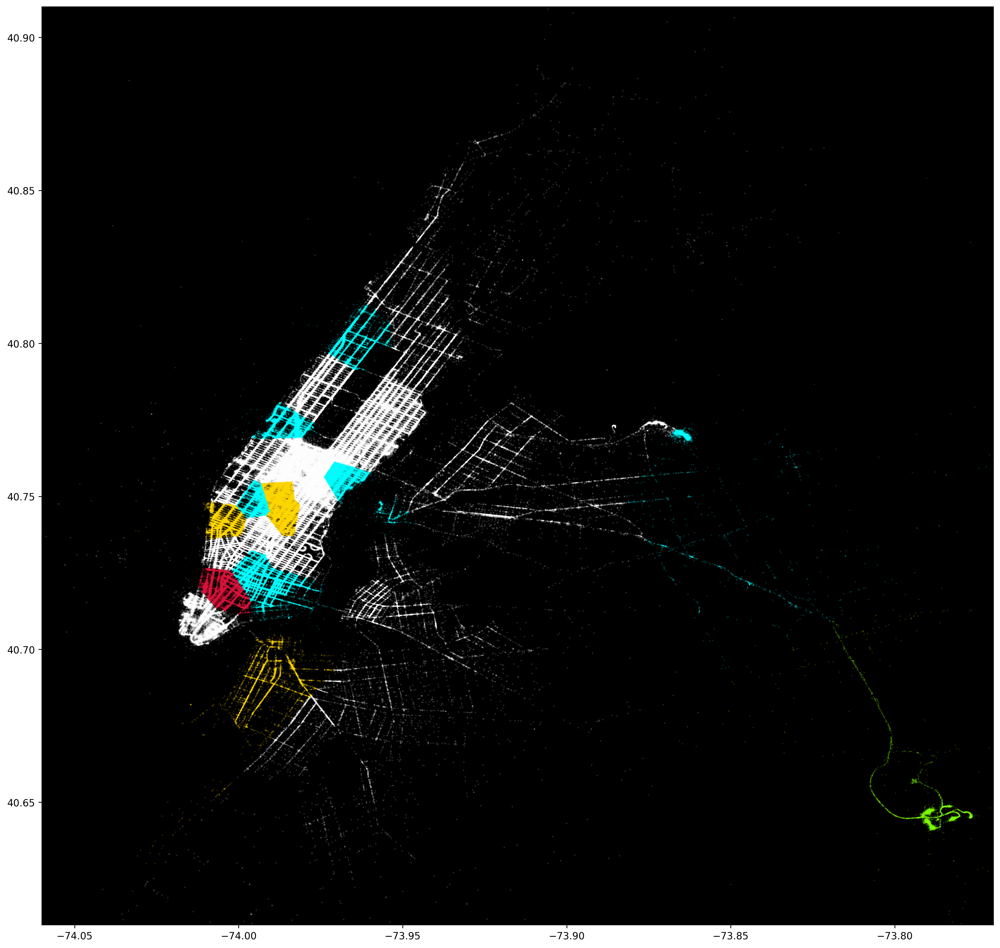

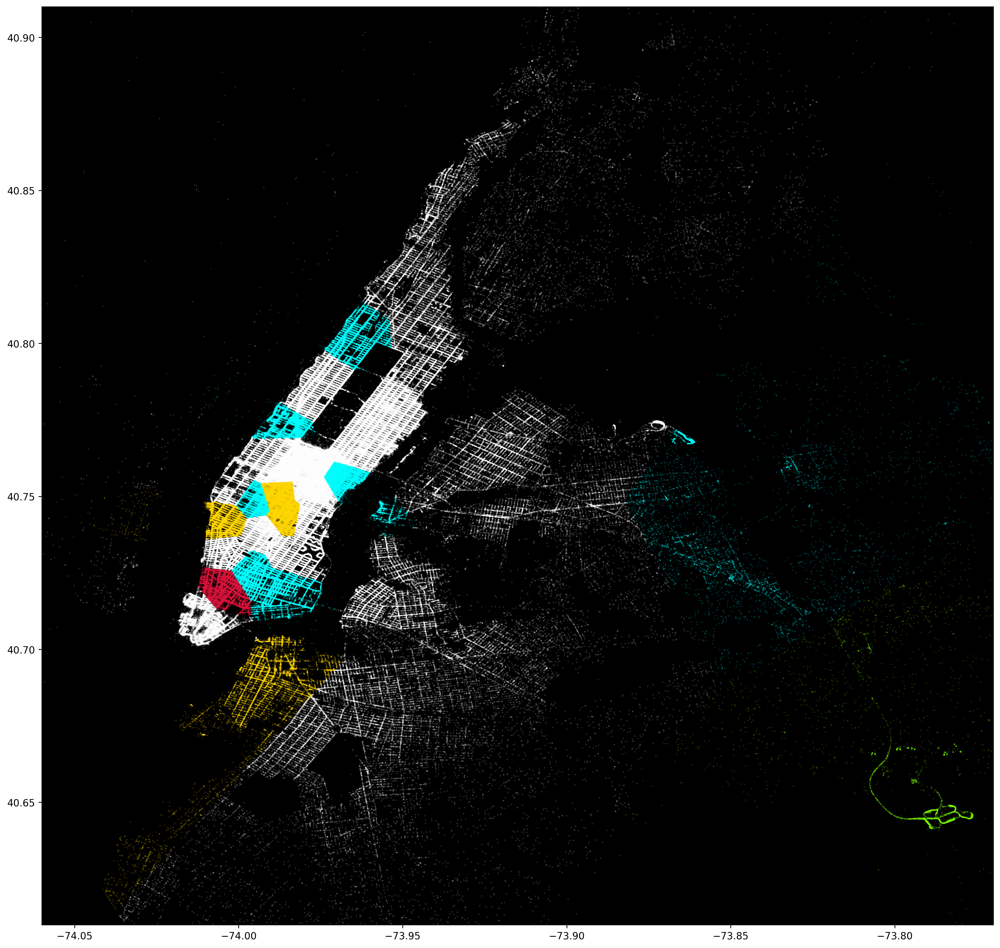

In [45]:
import matplotlib.pyplot as plt

def plot_scatter_locations(frame, colors, choose):
    %matplotlib inline
    
    plt.style.use('default')  # Better Styling
    new_style = {'grid': False}  # Remove grid
    matplotlib.rc('axes', **new_style)
    plt.rcParams['figure.figsize'] = (17.5, 17)  # Size of figure
    plt.rcParams['figure.dpi'] = 250

    var1 = choose + '_longitude'
    var2 = choose + '_latitude'

    # Plot scatter plot with specified colors
    plt.scatter(x=frame[var1], y=frame[var2], c=colors, cmap=plt.cm.get_cmap('viridis'), s=0.02, alpha=0.6)
    plt.xlim(-74.06, -73.77)
    plt.ylim(40.61, 40.91)
    plt.gca().set_facecolor('black')  # Background Color
    plt.savefig('plot_' + choose + '.png')
    plt.show()

# Plot pickup and dropoff locations
plot_scatter_locations(frame_with_durations_outliers_removed, colors_pickup, 'pickup')
plot_scatter_locations(frame_with_durations_outliers_removed, colors_dropoff, 'dropoff')

In [46]:
import pandas as pd
import matplotlib.pyplot as plt

def compute_pickups_per_day(month):
    time = month[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    time['tpep_pickup_datetime'] = pd.to_datetime(time['tpep_pickup_datetime'], dayfirst=True)
    time["pickup_day"] = time['tpep_pickup_datetime'].dt.strftime('%u').astype(int)
    time["pickup_hour"] = time['tpep_pickup_datetime'].dt.strftime('%H').astype(int)

    day_pickups = []
    night_pickups = []
    mid_night_pickups = []
    afternoon_pickups = []
    
    for i in range(1, 8):
        day_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 6) & (time.pickup_hour < 12)].shape[0])
        night_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 18) & (time.pickup_hour <= 23)].shape[0])
        mid_night_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 0) & (time.pickup_hour < 6)].shape[0])
        afternoon_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 12) & (time.pickup_hour < 18)].shape[0])

    days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    days_df = pd.DataFrame({'morning': day_pickups, 'afternoon': afternoon_pickups, 'night': night_pickups, 'midnight': mid_night_pickups}, index=days)
    days_df.plot(kind='bar', stacked=True, figsize=(8, 6))
    
    plt.xlabel('Days of the week')
    plt.ylabel('Number of pickups')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.legend(title='Time of Day')
    plt.tight_layout()  # Adjust layout to prevent clipping of labels
    plt.show()

    for i in range(len(days)):
        print("{} - morning: {}, afternoon: {}, night: {}, midnight: {}".format(days[i], mid_night_pickups[i], day_pickups[i], afternoon_pickups[i], night_pickups[i]))

    return time


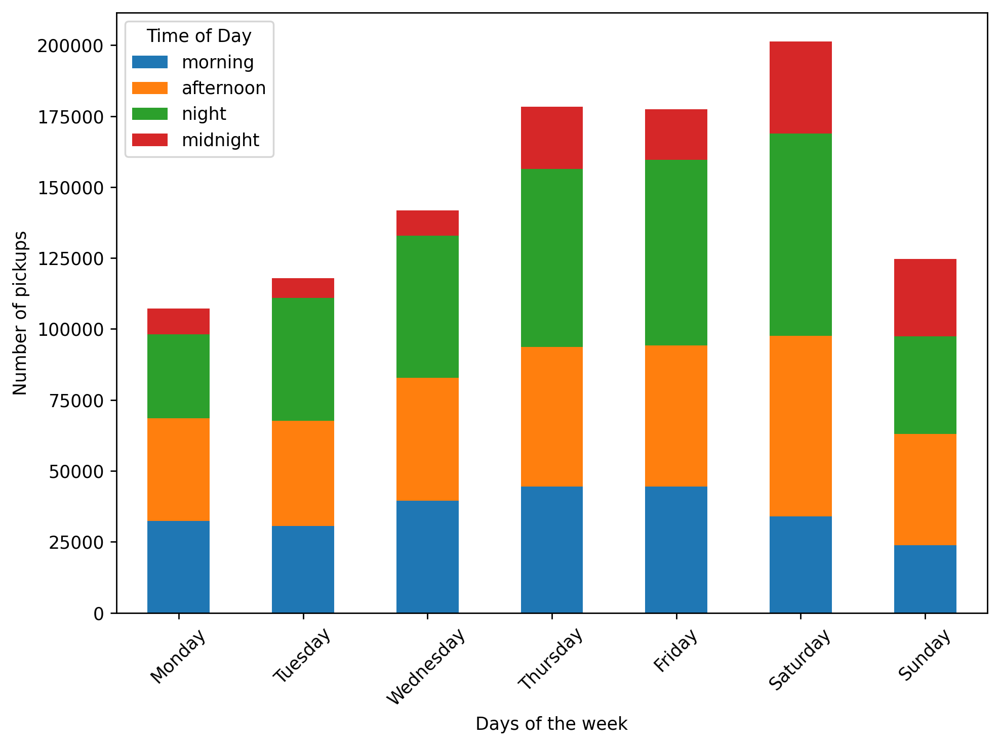

Monday - morning: 9198, afternoon: 32344, night: 36180, midnight: 29567
Tuesday - morning: 6808, afternoon: 30656, night: 37035, midnight: 43339
Wednesday - morning: 8884, afternoon: 39509, night: 43303, midnight: 50080
Thursday - morning: 21964, afternoon: 44404, night: 49282, midnight: 62629
Friday - morning: 17698, afternoon: 44519, night: 49714, midnight: 65415
Saturday - morning: 32572, afternoon: 33960, night: 63662, midnight: 71192
Sunday - morning: 27231, afternoon: 23857, night: 39131, midnight: 34442


In [47]:
times_of_day_dframe = compute_pickups_per_day(month)

In [48]:
frame_with_durations_outliers_removed.head(5)

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,...,log_distance,log_speed,lat_bin,lon_bin,pickup_cluster,dropoff_cluster,Regions_pickup_cluster,Regions_dropoff_cluster,Regions pickup_cluster,Regions dropoff_cluster
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,...,0.463734,1.667707,40.7501,-73.9939,26,18,Queens,Manhattan,Queens,Manhattan
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759110,1,N,...,1.193922,2.292535,40.7242,-74.0016,13,9,Bronx,Manhattan,Bronx,Manhattan
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,...,0.587787,2.379546,40.8028,-73.9633,23,10,Queens,Manhattan,Queens,Manhattan
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,...,-0.693147,2.708050,40.7138,-74.0091,6,13,Manhattan,Bronx,Manhattan,Bronx
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,...,1.098612,2.248518,40.7624,-73.9712,3,19,Manhattan,Brooklyn,Manhattan,Brooklyn


In [49]:
print(frame_with_durations_outliers_removed.columns)


Index(['VendorID', 'payment_type', 'passenger_count', 'trip_distance',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'RateCodeID', 'store_and_fwd_flag', 'trip_times',
       'pickup_times', 'Speed', 'log_times', 'log_distance', 'log_speed',
       'lat_bin', 'lon_bin', 'pickup_cluster', 'dropoff_cluster',
       'Regions_pickup_cluster', 'Regions_dropoff_cluster',
       'Regions pickup_cluster', 'Regions dropoff_cluster'],
      dtype='object')


In [50]:
import pandas as pd

frame_with_durations_outliers_removed['pickup_times'] = pd.to_datetime(frame_with_durations_outliers_removed['pickup_times'])
frame_with_durations_outliers_removed['trip_times'] = pd.to_datetime(frame_with_durations_outliers_removed['trip_times'])

# Extracting hour of the day and day of the week from 'pickup_times'
frame_with_durations_outliers_removed['pickup_hour'] = frame_with_durations_outliers_removed['pickup_times'].dt.hour
frame_with_durations_outliers_removed['pickup_day_of_week'] = frame_with_durations_outliers_removed['pickup_times'].dt.dayofweek

# Extract hour of the day and day of the week from 'trip_times'
frame_with_durations_outliers_removed['trip_hour'] = frame_with_durations_outliers_removed['trip_times'].dt.hour
frame_with_durations_outliers_removed['trip_day_of_week'] = frame_with_durations_outliers_removed['trip_times'].dt.dayofweek

# Now you can use these new columns ('pickup_hour', 'pickup_day_of_week', 'trip_hour', 'trip_day_of_week') for analysis or plotting
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize  # Add this import statement


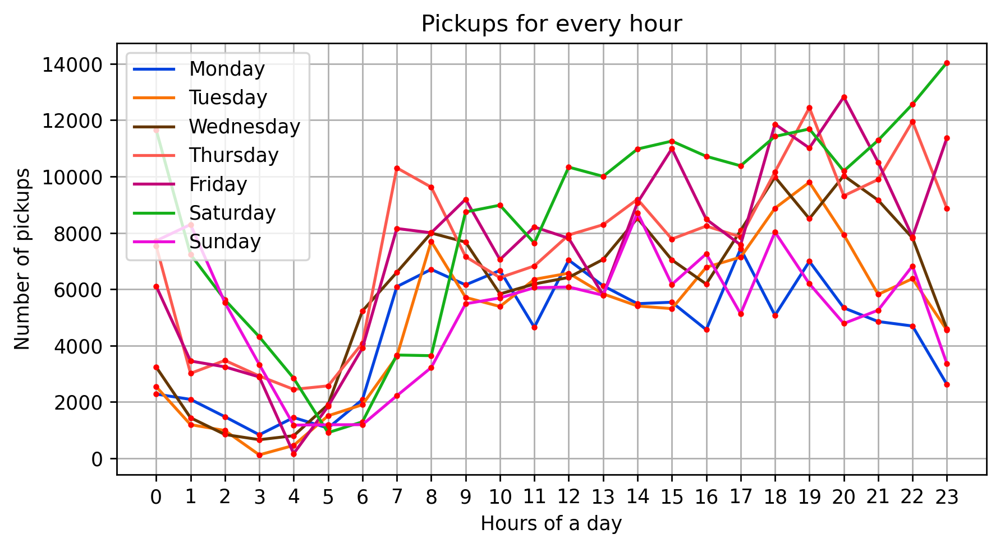

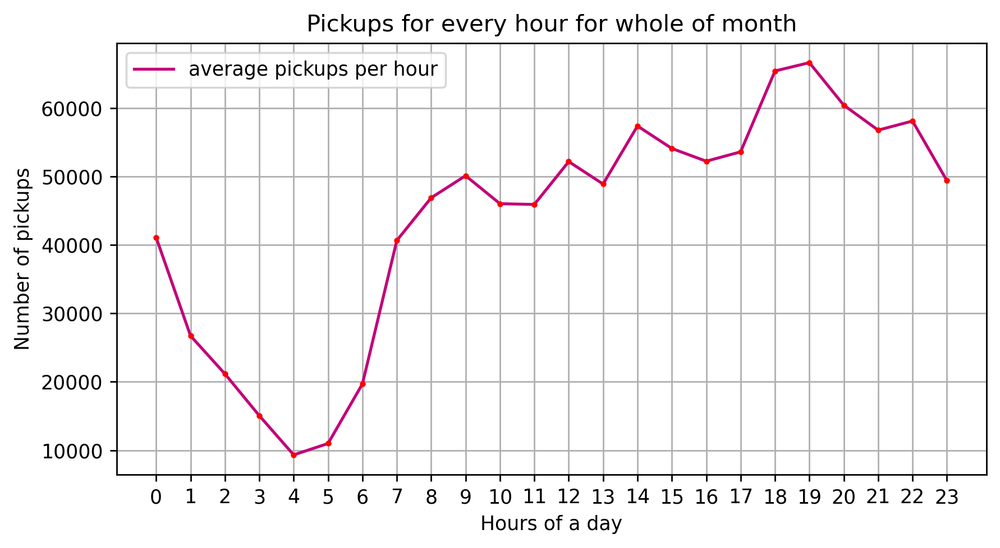

In [52]:
#pickups and distances travelled at what time of the day??
def pickup_in_day(frame):
    hour_pickups = []
    temp = []
    for i in range(1,8):
        for j in range(0,24):
            temp.append(frame[(frame.pickup_day == i) & (frame.pickup_hour == j)].shape[0])
        hour_pickups.append(temp)
        temp = []
    colors = ['xkcd:blue','xkcd:orange','xkcd:brown','xkcd:coral','xkcd:magenta','xkcd:green','xkcd:fuchsia']
    days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

    plt.figure(figsize=(8,4))
    hours_lis = [s for s in range(0,24)]
    for k in range(0,7):
        plt.plot(hours_lis,hour_pickups[k],colors[k],label = days[k])
        plt.plot(hours_lis,hour_pickups[k], 'ro',  markersize=2)

    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour')
    plt.legend()
    plt.grid(True)
    plt.show()

    hour_pickup_month = []
    for j in range(0,24):
        hour_pickup_month.append(frame[frame.pickup_hour == j].shape[0])

    plt.figure(figsize=(8,4))
    hours_lis = [s for s in range(0,24)]
    plt.plot(hours_lis,hour_pickup_month,'xkcd:magenta',label = 'average pickups per hour')
    plt.plot(hours_lis,hour_pickup_month, 'ro',  markersize=2)

    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour for whole of month')
    plt.legend()
    plt.grid(True)
    plt.show()

pickup_in_day(times_of_day_dframe)


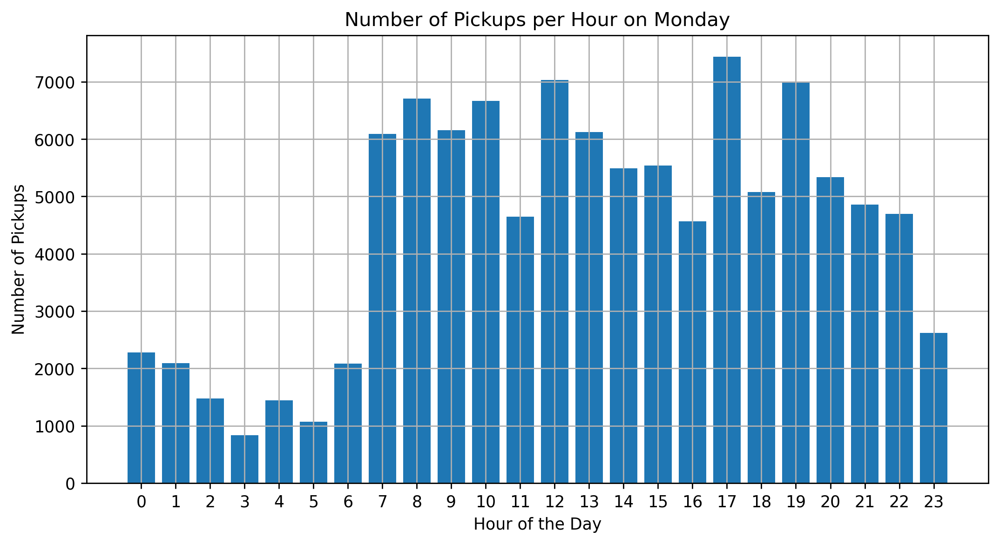

Pickups per hour on Monday:
pickup_hour
0     2279
1     2090
2     1475
3      835
4     1446
5     1073
6     2082
7     6090
8     6704
9     6154
10    6665
11    4649
12    7033
13    6123
14    5487
15    5538
16    4564
17    7435
18    5073
19    6989
20    5338
21    4853
22    4694
23    2620
dtype: int64


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,...,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickup_day,pickup_hour
0,2,2015-01-15 19:05:00,15-01-2015 19:23,1,1.59,-73.993896,40.750111,1,N,-73.974785,...,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05,Thursday,19
1,1,2015-01-10 20:33:00,10-01-2015 20:53,1,3.30,-74.001648,40.724243,1,N,-73.994415,...,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80,Saturday,20
2,1,2015-01-10 20:33:00,10-01-2015 20:43,1,1.80,-73.963341,40.802788,1,N,-73.951820,...,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80,Saturday,20
3,1,2015-01-10 20:33:00,10-01-2015 20:35,1,0.50,-74.009087,40.713818,1,N,-74.004326,...,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80,Saturday,20
4,1,2015-01-10 20:33:00,10-01-2015 20:52,1,3.00,-73.971176,40.762428,1,N,-74.004181,...,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30,Saturday,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524262,2,2015-01-24 00:26:00,24-01-2015 00:31,2,0.73,-73.999977,40.719288,1,N,-74.002197,...,1,5.0,0.5,0.5,1.26,0.0,0.3,7.56,Saturday,0
524263,2,2015-01-24 00:26:00,24-01-2015 00:31,5,0.79,-73.971626,40.754742,1,N,-73.972130,...,1,5.0,0.5,0.5,1.26,0.0,0.3,7.56,Saturday,0
524264,2,2015-01-24 00:26:00,24-01-2015 00:35,6,1.92,-73.952026,40.773380,1,N,-73.976402,...,1,9.0,0.5,0.5,2.06,0.0,0.3,12.36,Saturday,0
524265,2,2015-01-24 00:26:00,24-01-2015 00:33,1,0.74,-73.979996,40.761768,1,N,-73.967865,...,1,5.5,0.5,0.5,2.00,0.0,0.3,8.80,Saturday,0


In [53]:
import pandas as pd
import dask.dataframe as dd
import matplotlib.pyplot as plt

def compute_pickups_per_day(month, specific_day=None):
    # Check if the DataFrame is a Dask DataFrame and compute if necessary
    if isinstance(month, dd.DataFrame):
        month = month.compute()
    
    # Convert the datetime column to proper datetime format
    month['tpep_pickup_datetime'] = pd.to_datetime(month['tpep_pickup_datetime'], dayfirst=True)
    month["pickup_day"] = month['tpep_pickup_datetime'].dt.strftime('%A')
    month["pickup_hour"] = month['tpep_pickup_datetime'].dt.hour

    # If a specific day is provided, show pickups per hour for that day
    if specific_day:
        pickups_per_hour = month[month['pickup_day'] == specific_day].groupby('pickup_hour').size()
        plt.figure(figsize=(10, 5))
        plt.bar(pickups_per_hour.index, pickups_per_hour.values)
        plt.xlabel('Hour of the Day')
        plt.ylabel('Number of Pickups')
        plt.title(f'Number of Pickups per Hour on {specific_day}')
        plt.xticks(range(0, 24))
        plt.grid(True)
        plt.show()
        print(f"Pickups per hour on {specific_day}:\n{pickups_per_hour}")
    else:

        day_pickups = []
        night_pickups = []
        mid_night_pickups = []
        afternoon_pickups = []

        for day in ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']:
            day_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 6) & (month.pickup_hour < 12)].shape[0])
            night_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 18) & (month.pickup_hour <= 23)].shape[0])
            mid_night_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 0) & (month.pickup_hour < 6)].shape[0])
            afternoon_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 12) & (month.pickup_hour < 18)].shape[0])

        days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        days_df = pd.DataFrame({'morning': day_pickups, 'afternoon': afternoon_pickups, 'night': night_pickups, 'midnight': mid_night_pickups}, index=days)
        days_df.plot(kind='bar', stacked=True, figsize=(10, 6))
        
        plt.xlabel('Days of the week')
        plt.ylabel('Number of pickups')
        plt.xticks(rotation=45)  
        plt.legend(title='Time of Day')
        plt.tight_layout()  
        plt.show()

        for i, day in enumerate(days):
            print("{} - morning: {}, afternoon: {}, night: {}, midnight: {}".format(day, day_pickups[i], afternoon_pickups[i], night_pickups[i], mid_night_pickups[i]))

    return month

# Example usage:
# Assuming 'month' DataFrame is already loaded as a Dask DataFrame
#r Dask DataFrame
compute_pickups_per_day(month, specific_day='Monday')  # Example for specific day
# compute_pickups_per_day(month)  # For overall analysis without specific day


In [54]:
#There are 19 columns
month = dd.read_csv(r"C:\Users\HP\Documents\NITJ Books\sem 6\minor project\yellow_tripdata_2015-01.csv")
print(month.columns)

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')


Enter a specific day of the month (1-31): 1


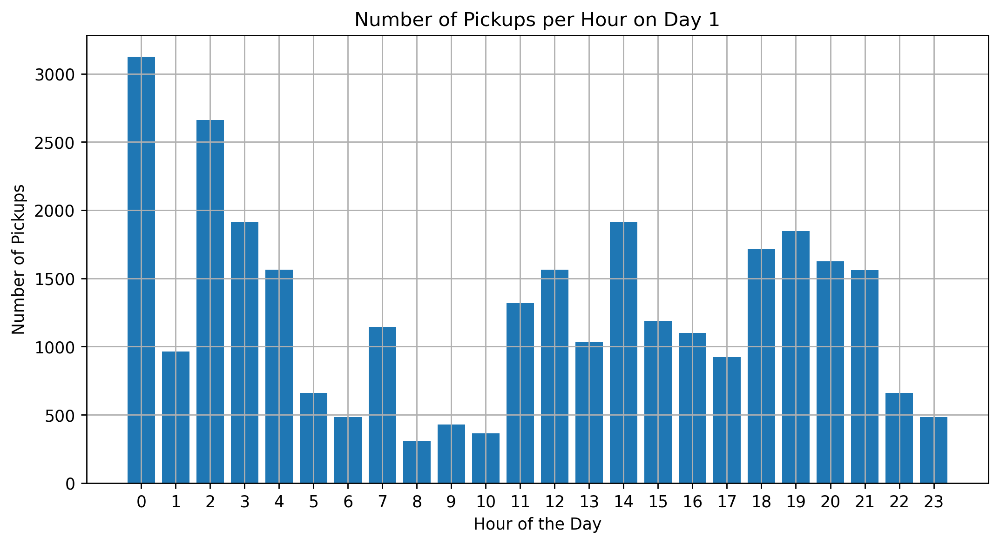

Pickups per hour on day 1:
pickup_hour
0     3124
1      965
2     2662
3     1914
4     1562
5      660
6      484
7     1144
8      308
9      429
10     364
11    1317
12    1562
13    1034
14    1914
15    1188
16    1100
17     924
18    1716
19    1848
20    1625
21    1561
22     660
23     484
dtype: int64


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,...,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickup_day,pickup_hour
0,2,2015-01-15 19:05:00,15-01-2015 19:23,1,1.59,-73.993896,40.750111,1,N,-73.974785,...,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05,15,19
1,1,2015-01-10 20:33:00,10-01-2015 20:53,1,3.30,-74.001648,40.724243,1,N,-73.994415,...,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80,10,20
2,1,2015-01-10 20:33:00,10-01-2015 20:43,1,1.80,-73.963341,40.802788,1,N,-73.951820,...,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80,10,20
3,1,2015-01-10 20:33:00,10-01-2015 20:35,1,0.50,-74.009087,40.713818,1,N,-74.004326,...,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80,10,20
4,1,2015-01-10 20:33:00,10-01-2015 20:52,1,3.00,-73.971176,40.762428,1,N,-74.004181,...,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30,10,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524262,2,2015-01-24 00:26:00,24-01-2015 00:31,2,0.73,-73.999977,40.719288,1,N,-74.002197,...,1,5.0,0.5,0.5,1.26,0.0,0.3,7.56,24,0
524263,2,2015-01-24 00:26:00,24-01-2015 00:31,5,0.79,-73.971626,40.754742,1,N,-73.972130,...,1,5.0,0.5,0.5,1.26,0.0,0.3,7.56,24,0
524264,2,2015-01-24 00:26:00,24-01-2015 00:35,6,1.92,-73.952026,40.773380,1,N,-73.976402,...,1,9.0,0.5,0.5,2.06,0.0,0.3,12.36,24,0
524265,2,2015-01-24 00:26:00,24-01-2015 00:33,1,0.74,-73.979996,40.761768,1,N,-73.967865,...,1,5.5,0.5,0.5,2.00,0.0,0.3,8.80,24,0


In [55]:
import pandas as pd
import dask.dataframe as dd
import matplotlib.pyplot as plt

def compute_pickups_per_day(month, specific_day_of_month=None):

    if isinstance(month, dd.DataFrame):
        month = month.compute()
    
    month['tpep_pickup_datetime'] = pd.to_datetime(month['tpep_pickup_datetime'], dayfirst=True)
    month["pickup_day"] = month['tpep_pickup_datetime'].dt.day
    month["pickup_hour"] = month['tpep_pickup_datetime'].dt.hour

    if specific_day_of_month:
        pickups_per_hour = month[month['pickup_day'] == specific_day_of_month].groupby('pickup_hour').size()
        plt.figure(figsize=(10, 5))
        plt.bar(pickups_per_hour.index, pickups_per_hour.values)
        plt.xlabel('Hour of the Day')
        plt.ylabel('Number of Pickups')
        plt.title(f'Number of Pickups per Hour on Day {specific_day_of_month}')
        plt.xticks(range(0, 24))
        plt.grid(True)
        plt.show()
        print(f"Pickups per hour on day {specific_day_of_month}:\n{pickups_per_hour}")
    else:
        # Calculate pickups for different times of day for each day of the month
        days_in_month = month['pickup_day'].unique()
        days_in_month.sort()
        
        day_pickups = []
        night_pickups = []
        mid_night_pickups = []
        afternoon_pickups = []

        for day in days_in_month:
            day_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 6) & (month.pickup_hour < 12)].shape[0])
            night_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 18) & (month.pickup_hour <= 23)].shape[0])
            mid_night_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 0) & (month.pickup_hour < 6)].shape[0])
            afternoon_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 12) & (month.pickup_hour < 18)].shape[0])

        days_df = pd.DataFrame({'morning': day_pickups, 'afternoon': afternoon_pickups, 'night': night_pickups, 'midnight': mid_night_pickups}, index=days_in_month)
        days_df.plot(kind='bar', stacked=True, figsize=(10, 6))
        
        plt.xlabel('Days of the Month')
        plt.ylabel('Number of pickups')
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.legend(title='Time of Day')
        plt.tight_layout()  # Adjust layout to prevent clipping of labels
        plt.show()

        for i, day in enumerate(days_in_month):
            print("Day {} - morning: {}, afternoon: {}, night: {}, midnight: {}".format(day, mid_night_pickups[i], day_pickups[i], afternoon_pickups[i], night_pickups[i]))

    return month

user_input = input("Enter a specific day of the month (1-31): ")
try:
    specific_day_of_month = int(user_input)
    if specific_day_of_month < 1 or specific_day_of_month > 31:
        raise ValueError
except ValueError:
    print("Invalid input. Please enter a valid day of the month between 1 and 31.")
    specific_day_of_month = None

# Call the function with your DataFrame and user input
compute_pickups_per_day(month, specific_day_of_month)
# compute_pickups_per_day(month)  # For overall analysis without specifying a day of the month


In [56]:
#new try


In [57]:
pip install dask-ml


  Using cached dask_ml-2024.4.4-py3-none-any.whl (149 kB)
  Using cached dask_glm-0.3.2-py2.py3-none-any.whl (13 kB)
  Using cached sparse-0.15.4-py2.py3-none-any.whl (237 kB)
     ---------------------------------------- 1.0/1.0 MB 790.1 kB/s eta 0:00:00
  Using cached distributed-2024.5.1-py3-none-any.whl (1.0 MB)
  Using cached numpy-1.21.6-cp39-cp39-win_amd64.whl (14.0 MB)
  Using cached pandas-2.2.1-cp39-cp39-win_amd64.whl (11.6 MB)
  Using cached pandas-2.2.0-cp39-cp39-win_amd64.whl (11.6 MB)
  Using cached pandas-2.1.4-cp39-cp39-win_amd64.whl (10.8 MB)
  Using cached pandas-2.1.3-cp39-cp39-win_amd64.whl (10.8 MB)
  Using cached pandas-2.1.2-cp39-cp39-win_amd64.whl (10.8 MB)
  Using cached pandas-2.1.1-cp39-cp39-win_amd64.whl (10.8 MB)
  Using cached pandas-2.1.0-cp39-cp39-win_amd64.whl (11.2 MB)
  Using cached pandas-2.0.3-cp39-cp39-win_amd64.whl (10.8 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfull

ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\HP\\anaconda3\\anaconda new\\Lib\\site-packages\\~=mpy.libs\\libopenblas64__v0.3.23-293-gc2f4bdbb-gcc_10_3_0-2bde3a66a51006b2b53eb373ff767a3f.dll'
Consider using the `--user` option or check the permissions.



In [58]:
import pandas as pd
import dask.dataframe as dd
from sklearn.cluster import MiniBatchKMeans

month_pd = month.compute()

coords_pickup = month_pd[['pickup_latitude', 'pickup_longitude']].to_numpy()
coords_dropoff = month_pd[['dropoff_latitude', 'dropoff_longitude']].to_numpy()

kmeans_pickup = MiniBatchKMeans(n_clusters=40, batch_size=1000).fit(coords_pickup)
month_pd['pickup_cluster'] = kmeans_pickup.predict(coords_pickup)

kmeans_dropoff = MiniBatchKMeans(n_clusters=40, batch_size=1000).fit(coords_dropoff)
month_pd['dropoff_cluster'] = kmeans_dropoff.predict(coords_dropoff)

month_with_clusters = dd.from_pandas(month_pd, npartitions=month.npartitions)


Enter a specific day of the month (1-31): 1
Enter a specific location (pickup or dropoff cluster number): 10


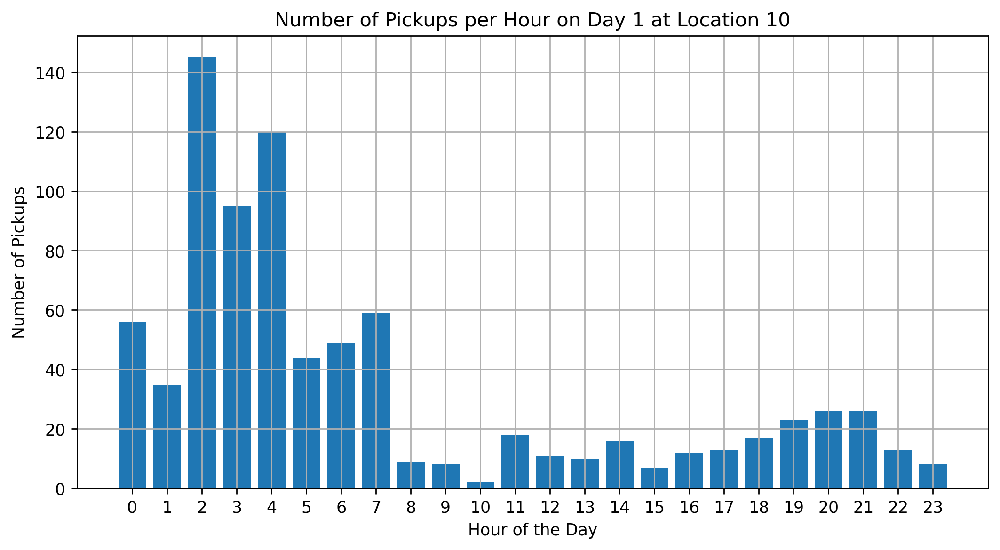

Pickups per hour on day 1 at location 10:
pickup_hour
0      56
1      35
2     145
3      95
4     120
5      44
6      49
7      59
8       9
9       8
10      2
11     18
12     11
13     10
14     16
15      7
16     12
17     13
18     17
19     23
20     26
21     26
22     13
23      8
dtype: int64


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,...,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickup_cluster,dropoff_cluster,pickup_day,pickup_hour
44,2,2015-01-25 00:13:00,25-01-2015 00:22,1,1.35,-73.933945,40.762852,1,N,-73.917023,...,0.5,0.5,0.70,0.0,0.3,10.00,10,14,25,0
133,1,2015-01-15 10:26:00,15-01-2015 10:27,1,0.00,-73.946526,40.744991,1,N,-73.946526,...,0.0,0.5,0.00,0.0,0.3,3.80,10,28,15,10
206,1,2015-01-26 13:04:00,26-01-2015 13:15,1,2.10,-73.944443,40.741562,1,N,-73.931107,...,0.0,0.5,1.00,0.0,0.3,11.30,10,14,26,13
274,2,2015-01-18 19:49:00,18-01-2015 20:19,1,18.36,-73.915321,40.760506,1,N,-73.680809,...,0.0,0.5,9.90,0.0,0.3,60.20,10,24,18,19
326,2,2015-01-08 16:24:00,08-01-2015 16:41,1,2.88,-73.959183,40.712029,1,N,-73.929955,...,1.0,0.5,0.00,0.0,0.3,15.30,16,10,8,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
523908,1,2015-01-14 05:18:00,14-01-2015 05:32,1,5.30,-73.925026,40.744110,1,N,-73.992210,...,0.5,0.5,0.00,0.0,0.3,18.30,10,38,14,5
523913,1,2015-01-14 05:18:00,14-01-2015 05:40,1,7.00,-74.006554,40.743965,1,N,-73.937126,...,0.5,0.5,6.07,0.0,0.3,30.37,7,10,14,5
523926,1,2015-01-06 13:08:00,06-01-2015 13:27,1,7.80,-73.870880,40.773701,1,N,-73.925453,...,0.0,0.5,0.00,0.0,0.3,24.30,4,10,6,13
524041,2,2015-01-15 08:13:00,15-01-2015 08:21,6,1.33,-73.918648,40.743408,1,N,-73.943069,...,0.0,0.5,0.00,0.0,0.3,8.30,10,28,15,8


In [76]:
import pandas as pd
import matplotlib.pyplot as plt

def compute_pickups_per_day(month, specific_day_of_month=None, specific_location=None):
    # Convert the datetime column to proper datetime format
    month['tpep_pickup_datetime'] = pd.to_datetime(month['tpep_pickup_datetime'], dayfirst=True)
    month["pickup_day"] = month['tpep_pickup_datetime'].dt.day
    month["pickup_hour"] = month['tpep_pickup_datetime'].dt.hour

    if specific_location:
        month = month[(month['pickup_cluster'] == specific_location) | (month['dropoff_cluster'] == specific_location)]

    if specific_day_of_month:
        pickups_per_hour = month[month['pickup_day'] == specific_day_of_month].groupby('pickup_hour').size()
        plt.figure(figsize=(10, 5))
        plt.bar(pickups_per_hour.index, pickups_per_hour.values)
        plt.xlabel('Hour of the Day')
        plt.ylabel('Number of Pickups')
        plt.title(f'Number of Pickups per Hour on Day {specific_day_of_month} at Location {specific_location}')
        plt.xticks(range(0, 24))
        plt.grid(True)
        plt.show()
        print(f"Pickups per hour on day {specific_day_of_month} at location {specific_location}:\n{pickups_per_hour}")
    else:
        # Calculate pickups for different times of day for each day of the month
        days_in_month = month['pickup_day'].unique()
        days_in_month.sort()
        
        day_pickups = []
        night_pickups = []
        mid_night_pickups = []
        afternoon_pickups = []

        for day in days_in_month:
            day_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 6) & (month.pickup_hour < 12)].shape[0])
            night_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 18) & (month.pickup_hour <= 23)].shape[0])
            mid_night_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 0) & (month.pickup_hour < 6)].shape[0])
            afternoon_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 12) & (month.pickup_hour < 18)].shape[0])

        days_df = pd.DataFrame({'morning': day_pickups, 'afternoon': afternoon_pickups, 'night': night_pickups, 'midnight': mid_night_pickups}, index=days_in_month)
        days_df.plot(kind='bar', stacked=True, figsize=(10, 6))
        
        plt.xlabel('Days of the Month')
        plt.ylabel('Number of pickups')
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.legend(title='Time of Day')
        plt.tight_layout()  # Adjust layout to prevent clipping of labels
        plt.show()

        for i, day in enumerate(days_in_month):
            print("Day {} - morning: {}, afternoon: {}, night: {}, midnight: {}".format(day, mid_night_pickups[i], day_pickups[i], afternoon_pickups[i], night_pickups[i]))

    return month

user_day_input = input("Enter a specific day of the month (1-31): ")
try:
    specific_day_of_month = int(user_day_input)
    if specific_day_of_month < 1 or specific_day_of_month > 31:
        raise ValueError
except ValueError:
    print("Invalid input. Please enter a valid day of the month between 1 and 31.")
    specific_day_of_month = None

user_location_input = input("Enter a specific location (pickup or dropoff cluster number): ")
try:
    specific_location = int(user_location_input)
except ValueError:
    print("Invalid input. Please enter a valid cluster number.")
    specific_location = None

compute_pickups_per_day(month_pd, specific_day_of_month, specific_location)


Enter a specific location (pickup or dropoff cluster number): 6
Enter a day range in the format 'start_day-end_day' (e.g., '1-15'), or press Enter to skip: 1-31


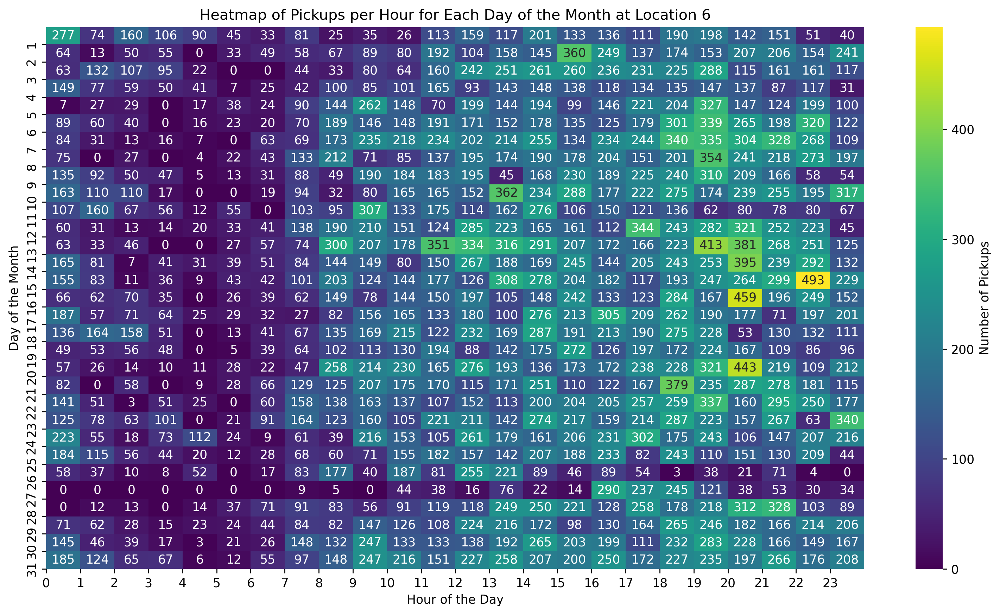

     pickup_day pickup_hour  number_of_pickups
0             1           0                277
1             2           0                 64
2             3           0                 63
3             4           0                149
4             5           0                  7
..          ...         ...                ...
739          27          23                 34
740          28          23                 89
741          29          23                206
742          30          23                167
743          31          23                208

[744 rows x 3 columns]


In [60]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def compute_pickups_per_day(month, specific_location=None, day_range=None):
    # Convert the datetime column to proper datetime format
    month['tpep_pickup_datetime'] = pd.to_datetime(month['tpep_pickup_datetime'], dayfirst=True)
    month["pickup_day"] = month['tpep_pickup_datetime'].dt.day
    month["pickup_hour"] = month['tpep_pickup_datetime'].dt.hour

    # If a specific location is provided, filter the DataFrame by that location
    if specific_location is not None:
        month = month[(month['pickup_cluster'] == specific_location) | (month['dropoff_cluster'] == specific_location)]

    # Apply day range filter if specified
    if day_range:
        start_day, end_day = day_range
        month = month[(month['pickup_day'] >= start_day) & (month['pickup_day'] <= end_day)]

    # Calculate pickups for each hour of the day for each day of the month
    pickups_per_hour_day = month.groupby(['pickup_day', 'pickup_hour']).size().unstack(fill_value=0)

    # Create the heatmap
    plt.figure(figsize=(15, 8))
    sns.heatmap(pickups_per_hour_day, cmap='viridis', annot=True, fmt='d', cbar_kws={'label': 'Number of Pickups'})
    plt.xlabel('Hour of the Day')
    plt.ylabel('Day of the Month')
    plt.title(f'Heatmap of Pickups per Hour for Each Day of the Month at Location {specific_location}')
    plt.xticks(ticks=range(24), labels=range(24))
    plt.yticks(ticks=range(1, pickups_per_hour_day.shape[0] + 1), labels=range(1, pickups_per_hour_day.shape[0] + 1))
    plt.show()

    # Convert the data to a DataFrame
    pickups_df = pickups_per_hour_day.reset_index()
    pickups_df = pickups_df.melt(id_vars='pickup_day', var_name='pickup_hour', value_name='number_of_pickups')

    return pickups_df

# Example usage:
# Ensure your 'month' DataFrame (frame_with_durations_outliers_removed) contains the necessary columns

# Get user input for a specific location
user_location_input = input("Enter a specific location (pickup or dropoff cluster number): ")
try:
    specific_location = int(user_location_input)
except ValueError:
    print("Invalid input. Please enter a valid cluster number.")
    specific_location = None

# Optionally get user input for a specific day range
day_range_input = input("Enter a day range in the format 'start_day-end_day' (e.g., '1-15'), or press Enter to skip: ")
if day_range_input:
    try:
        day_range = tuple(map(int, day_range_input.split('-')))
        if day_range[0] < 1 or day_range[1] > 31 or day_range[0] > day_range[1]:
            raise ValueError
    except ValueError:
        print("Invalid input. Please enter a valid day range.")
        day_range = None
else:
    day_range = None

# Call the function with your DataFrame and user input
pickups_df = compute_pickups_per_day(month_pd, specific_location, day_range)

# Display the resulting DataFrame
print(pickups_df)


In [61]:
month.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,15-01-2015 19:05,15-01-2015 19:23,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,10-01-2015 20:33,10-01-2015 20:53,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759110,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,10-01-2015 20:33,10-01-2015 20:43,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,10-01-2015 20:33,10-01-2015 20:35,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,10-01-2015 20:33,10-01-2015 20:52,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30


In [62]:
# Clustering of regions:

In [63]:
frame_with_durations_outliers_removed['lat_bin'] = np.round(frame_with_durations_outliers_removed['pickup_latitude'],4)
frame_with_durations_outliers_removed['lon_bin'] = np.round(frame_with_durations_outliers_removed['pickup_longitude'],4)

In [64]:
pip install gpxpy

Note: you may need to restart the kernel to use updated packages.


In [65]:
import gpxpy

In [66]:
# Find the best cluster where the least number of clusters have a min. radius of at least 1km or more
coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values

def find_min_distance(cluster_centers, cluster_len):
    nice_points = 0
    wrong_points = 0
    for i in range(0, cluster_len-1):
        min_value = 1000000
        for j in range(i+1, cluster_len):
            min_value = min(min_value, gpxpy.geo.haversine_distance(cluster_centers[i][0], cluster_centers[i][1],cluster_centers[j][0], cluster_centers[j][1]))
        if min_value!=1000000 and (min_value/1000) >= 1:
            nice_points +=1
        else:
            wrong_points += 1
    print (cluster_len, "Cents with min distance < 1:", wrong_points, "Cents with min distance > 1:", nice_points)

    if nice_points == cluster_len-1:
        return 1
    else:
        return 0

def find_clusters(increment):
    kmeans = MiniBatchKMeans(n_clusters=increment, batch_size=10000).fit(coords)
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values)
    cluster_centers = kmeans.cluster_centers_
    cluster_len = len(cluster_centers)
    return cluster_centers, cluster_len

for increment in range(10, 100, 10):
    cluster_centers, cluster_len = find_clusters(increment)
    more_than_5km = find_min_distance(cluster_centers, cluster_len)


10 Cents with min distance < 1: 0 Cents with min distance > 1: 9
20 Cents with min distance < 1: 1 Cents with min distance > 1: 18
30 Cents with min distance < 1: 4 Cents with min distance > 1: 25
40 Cents with min distance < 1: 13 Cents with min distance > 1: 26
50 Cents with min distance < 1: 24 Cents with min distance > 1: 25
60 Cents with min distance < 1: 27 Cents with min distance > 1: 32
70 Cents with min distance < 1: 38 Cents with min distance > 1: 31
80 Cents with min distance < 1: 47 Cents with min distance > 1: 32
90 Cents with min distance < 1: 54 Cents with min distance > 1: 35


In [68]:
#Getting 40 clusters using the kmeans
kmeans = MiniBatchKMeans(n_clusters=40, batch_size=10000).fit(coords)
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values)

In [69]:
#Adding a new column describing what cluster the pickup point belongs to
frame_with_durations_outliers_removed.head(5)

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,...,pickup_cluster,dropoff_cluster,Regions_pickup_cluster,Regions_dropoff_cluster,Regions pickup_cluster,Regions dropoff_cluster,pickup_hour,pickup_day_of_week,trip_hour,trip_day_of_week
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,...,23,18,Queens,Manhattan,Queens,Manhattan,0,3,0,3
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759110,1,N,...,30,9,Bronx,Manhattan,Bronx,Manhattan,0,3,0,3
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,...,13,10,Queens,Manhattan,Queens,Manhattan,0,3,0,3
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,...,8,13,Manhattan,Bronx,Manhattan,Bronx,0,3,0,3
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,...,20,19,Manhattan,Brooklyn,Manhattan,Brooklyn,0,3,0,3


In [70]:
#Plotting the cluster centers on OSM
cluster_centers = kmeans.cluster_centers_
cluster_len = len(cluster_centers)
map_osm = folium.Map(location=[40.734695, -73.990372])
for i in range(cluster_len):
    folium.Marker(list((cluster_centers[i][0],cluster_centers[i][1])), popup=(str(cluster_centers[i][0])+str(cluster_centers[i][1]))).add_to(map_osm)
map_osm

In [71]:
# Plotting the clusters Formed:

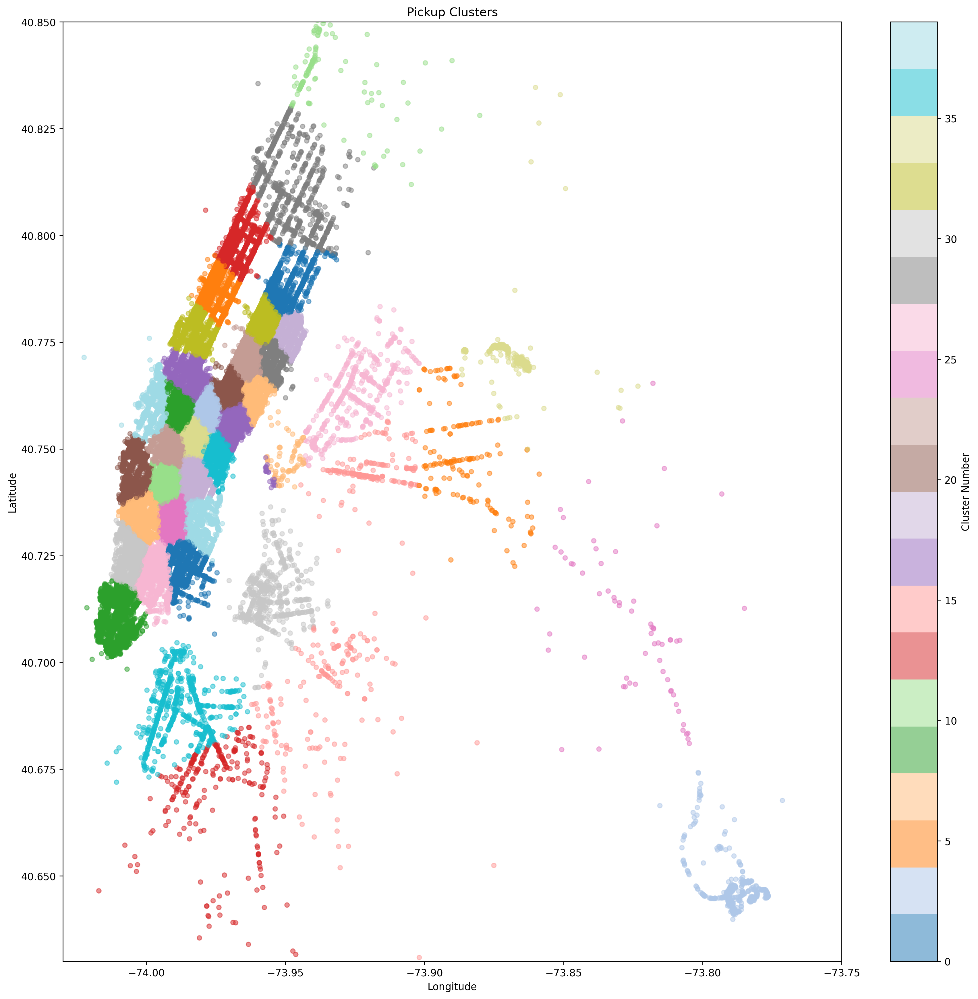

In [72]:
import matplotlib.pyplot as plt

def plot_clusters(frame):
    city_long_border = (-74.03, -73.75)
    city_lat_border = (40.63, 40.85)

    # Increase sample size for better representation
    sample_size = min(len(frame), 100000)

    fig, ax = plt.subplots(ncols=1, nrows=1)

    # Plot larger sample with adjusted marker size and transparency
    scatter = ax.scatter(frame.pickup_longitude.values[:sample_size], frame.pickup_latitude.values[:sample_size], s=20, alpha=0.5,
                         c=frame.pickup_cluster.values[:sample_size], cmap='tab20')

    # Set plot boundaries
    ax.set_xlim(city_long_border)
    ax.set_ylim(city_lat_border)

    # Add title
    ax.set_title('Pickup Clusters')

    # Add axis labels
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

    # Add colorbar using the scatter plot object
    cb = plt.colorbar(scatter, ax=ax, orientation='vertical')
    cb.set_label('Cluster Number')

    plt.show()

plot_clusters(frame_with_durations_outliers_removed)
